#  IN3050/IN4050 Mandatory Assignment 1: Traveling Salesman Problem


## Dmitrii Soltaganov

## Helper code for visualizing solutions

Here follows some helper code that you can use to visualize the plans you generate. These visualizations can **help you check if you are making sensible tours or not**. The optimization algoritms below should hopefully find relatively nice looking tours, but perhaps with a few visible inefficiencies.

In [15]:
import matplotlib.pyplot as plt
import numpy as np
%matplotlib inline
np.random.seed(57)
#Map of Europe
europe_map = plt.imread('map.png')

#Lists of city coordinates
city_coords = {
    "Barcelona": [2.154007, 41.390205], "Belgrade": [20.46, 44.79], "Berlin": [13.40, 52.52], 
    "Brussels": [4.35, 50.85], "Bucharest": [26.10, 44.44], "Budapest": [19.04, 47.50],
    "Copenhagen": [12.57, 55.68], "Dublin": [-6.27, 53.35], "Hamburg": [9.99, 53.55], 
    "Istanbul": [28.98, 41.02], "Kyiv": [30.52, 50.45], "London": [-0.12, 51.51], 
    "Madrid": [-3.70, 40.42], "Milan": [9.19, 45.46], "Moscow": [37.62, 55.75],
    "Munich": [11.58, 48.14], "Paris": [2.35, 48.86], "Prague": [14.42, 50.07],
    "Rome": [12.50, 41.90], "Saint Petersburg": [30.31, 59.94], "Sofia": [23.32, 42.70],
    "Stockholm": [18.06, 60.33], "Vienna": [16.36, 48.21], "Warsaw": [21.02, 52.24]}


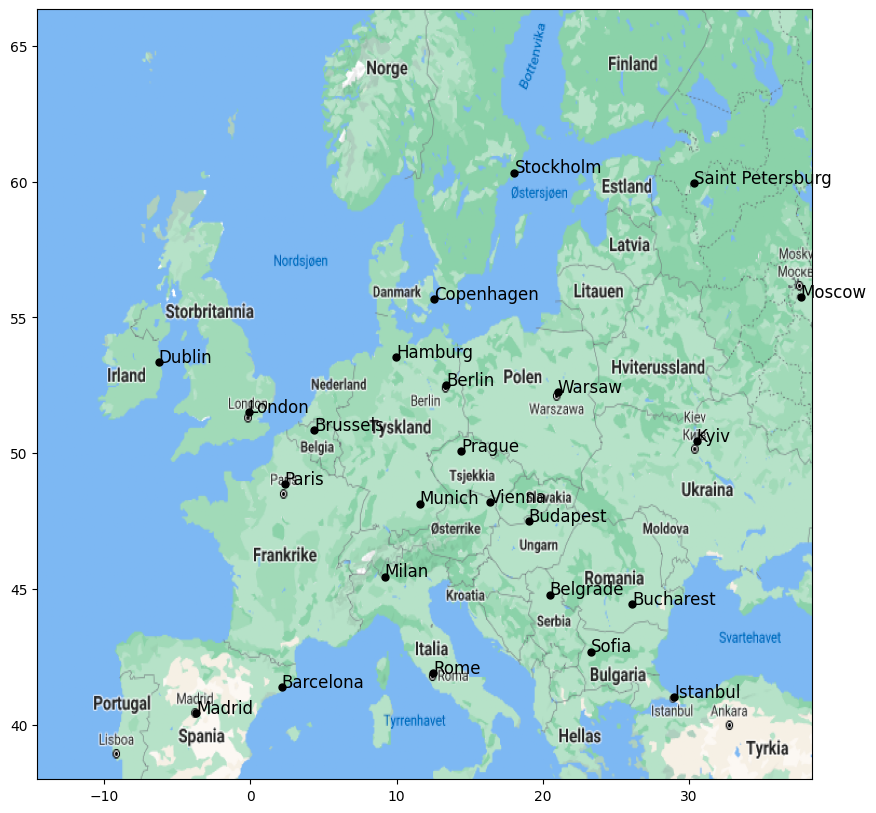

In [16]:
#Helper code for plotting plans
#First, visualizing the cities.
import csv
with open("european_cities.csv", "r") as f:
    data = list(csv.reader(f, delimiter=';'))
    cities = data[0]

fig, ax = plt.subplots(figsize=(10, 10))
ax.imshow(europe_map, extent=[-14.56, 38.43, 37.697 + 0.3, 64.344 + 2.0], aspect="auto")

# Map (long, lat) to (x, y) for plotting
for city, location in city_coords.items():
    x, y = (location[0], location[1])
    plt.plot(x, y, 'ok', markersize=5)
    plt.text(x, y, city, fontsize=12)


In [17]:
#A method you can use to plot your plan on the map.
def plot_plan(city_order):
    fig, ax = plt.subplots(figsize=(10, 10))
    ax.imshow(europe_map, extent=[-14.56, 38.43, 37.697 + 0.3, 64.344 + 2.0], aspect="auto")

    # Map (long, lat) to (x, y) for plotting
    for index in range(len(city_order) - 1):
        current_city_coords = city_coords[city_order[index]]
        next_city_coords = city_coords[city_order[index+1]]
        x, y = current_city_coords[0], current_city_coords[1]
        #Plotting a line to the next city
        next_x, next_y = next_city_coords[0], next_city_coords[1]
        plt.plot([x, next_x], [y, next_y])

        plt.plot(x, y, 'ok', markersize=5)
        plt.text(x, y, index, fontsize=12)
    #Finally, plotting from last to first city
    first_city_coords = city_coords[city_order[0]]
    first_x, first_y = first_city_coords[0], first_city_coords[1]
    plt.plot([next_x, first_x], [next_y, first_y])
    #Plotting a marker and index for the final city
    plt.plot(next_x, next_y, 'ok', markersize=5)
    plt.text(next_x, next_y, index+1, fontsize=12)
    plt.show()


['Barcelona', 'Belgrade', 'Berlin', 'Brussels', 'Bucharest', 'Budapest', 'Copenhagen', 'Dublin', 'Hamburg', 'Istanbul', 'Kyiv', 'London', 'Madrid', 'Milan', 'Moscow', 'Munich', 'Paris', 'Prague', 'Rome', 'Saint Petersburg', 'Sofia', 'Stockholm', 'Vienna', 'Warsaw']


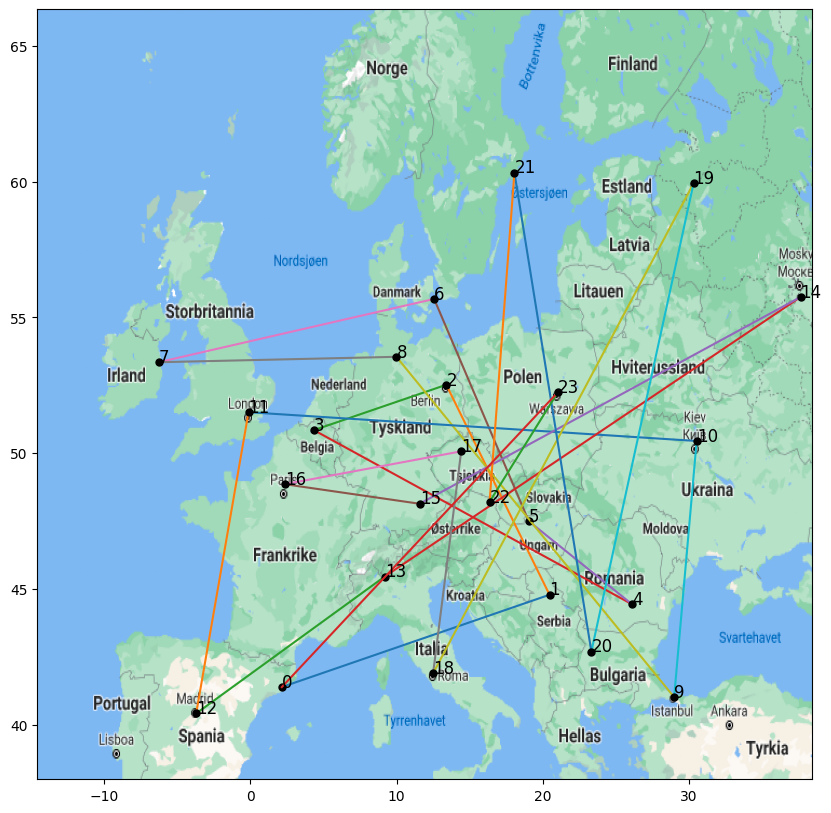

In [18]:
#Example usage of the plotting-method.
plan = list(city_coords.keys()) # Gives us the cities in alphabetic order
print(plan)
plot_plan(plan)

## Exhaustive Search
First, try to solve the problem by inspecting every possible tour. Start by writing a program to find the shortest
tour among a subset of the cities (say, **6** of them). Measure the amount of time your program takes. Incrementally
add more cities and observe how the time increases. Plot the shortest tours you found using the plot_plan method above, for 6 and 10 cities.

**Note:** To get distances between cities, use the dictionary `data` created by reading the file `european_cities.csv`. *Do not* calculate distances based on the coordinates. The actual distances do not only depend on the differences in the coordinates, but also of the curvature of the earth. The distances available in `data` are corrected for this, and contain the actual true distances.

6 Citites Best Route: ('Barcelona', 'Belgrade', 'Bucharest', 'Budapest', 'Berlin', 'Brussels')
6 Citites Best Distance: 5018
Time: 0.003


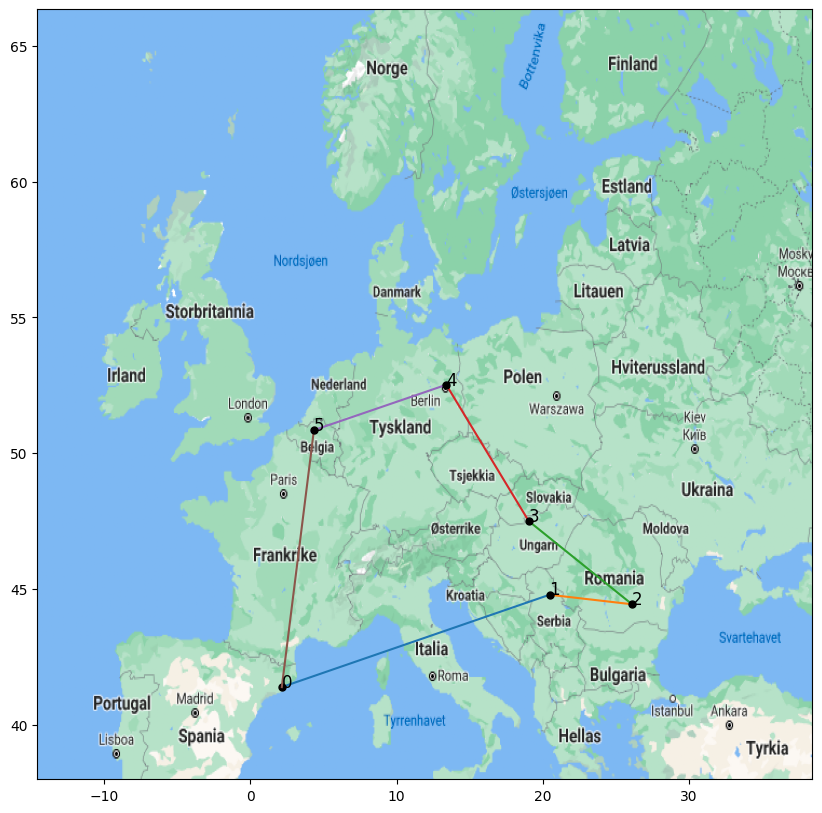

10 Citites Best Route: ('Copenhagen', 'Hamburg', 'Brussels', 'Dublin', 'Barcelona', 'Belgrade', 'Istanbul', 'Bucharest', 'Budapest', 'Berlin')
10 Citites Best Distance: 7486
Time: 20.511


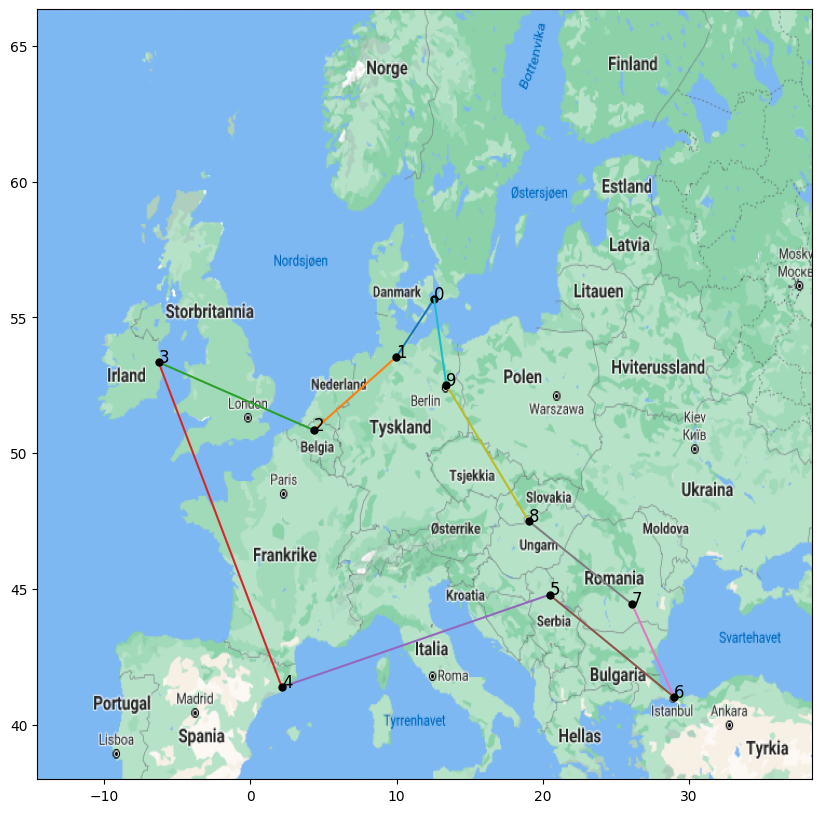

In [19]:
from itertools import permutations
import time

# Extract city names from the dataset
city_list = []

for city in data[0]:
    city_list.append(city)

# Select a subset of cities to analyze
cities = city_list[:6] 
cities7 = city_list[:7] 
cities8 = city_list[:8] 
cities9 = city_list[:9] 
cities10 = city_list[:10] 

def calculate_distance(city1, city2):
    city1_index = data[0].index(city1)
    city2_index = data[0].index(city2)
    distance = float(data[city2_index + 1][city1_index])  # Avstand mellom to byer
    return distance

# Hjelpemetode for å regne ut total distanse for en rute
def total_distance(cities):
    total_distance = 0
    cities = cities + (cities[0],)  # Complete the round-trip
    for i in range(len(cities) - 1):
        city1 = cities[i]
        city2 = cities[i + 1]
        total_distance += calculate_distance(city1, city2) 
    return total_distance

def exhaustive_search(cities):
    perm = permutations(cities)    
    distance = {}  # Store total distance for each permutation

    for p in perm:
        distance[p] = total_distance(p)  # Store total distance

    # Get the route corresponding to the minimum distance from dictionary
    best_route = min(distance, key=distance.get)
    return best_route, distance[best_route]

time_start = time.time()
# Find the optimal route for 6 cities
best_route, best_distance = exhaustive_search(cities)
time_end = time.time()
print("6 Citites Best Route:", best_route)
print("6 Citites Best Distance:", int(best_distance))
print("Time:", "{:.3f}".format(time_end - time_start))
plot_plan(best_route)

time_start = time.time()
# Find the optimal route for 10 cities
best_route, best_distance = exhaustive_search(cities10)
time_end = time.time()
print("10 Citites Best Route:", best_route)
print("10 Citites Best Distance:", int(best_distance))
print("Time:", "{:.3f}".format(time_end - time_start))
plot_plan(best_route)

What is the shortest tour (i.e., the actual sequence of cities, and its length) among the first 10 cities (that is,
the cities starting with B,C,D,H and I)? How long did your program take to find it? Calculate an approximation of how long it would take to perform exhaustive search on all 24 cities?

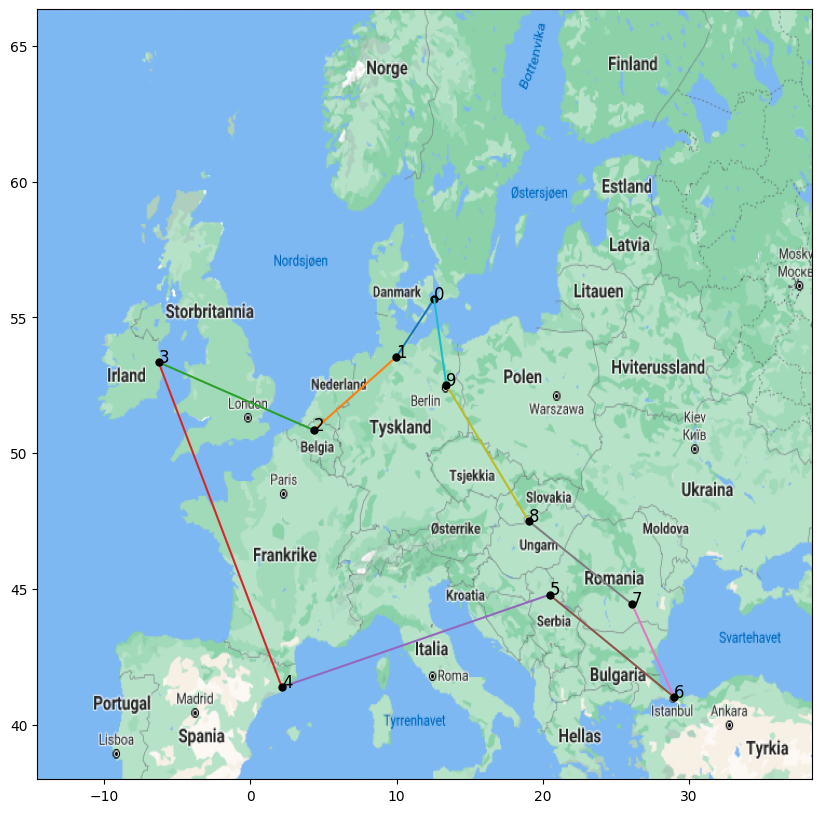

Best Route: ('Copenhagen', 'Hamburg', 'Brussels', 'Dublin', 'Barcelona', 'Belgrade', 'Istanbul', 'Bucharest', 'Budapest', 'Berlin')
Best Distance: 7486
Time complexity: 19.434 seconds
Time in seconds for 24 cities: 9.434165950507428e+18 years


In [20]:
# Answer
from math import factorial

time_start = time.time()
best_route, best_distance = exhaustive_search(cities10)
time_end = time.time()

plot_plan(best_route)
print("Best Route:", best_route)
print("Best Distance:", int(best_distance))
print("Time complexity:", "{:.3f}".format(time_end - time_start) + " seconds")

#Predicts the time complexity for 24 cities based on an exponential growth model.
def predict_time_complexity(n, base_n, base_time):
    growth_factor = base_time / factorial(base_n)
    return growth_factor * factorial(n)
print("Time in seconds for 24 cities: " + str(predict_time_complexity(24,10,time_end)/(3600*24*365)) + " years")


## Hill Climbing
Then, write a simple hill climber to solve the TSP. How well does the hill climber perform, compared to the result from the exhaustive search for the first **10 cities**? Since you are dealing with a stochastic algorithm, you
should run the algorithm several times to measure its performance. Report the length of the tour of the best,
worst and mean of 20 runs (with random starting tours), as well as the standard deviation of the runs, both with the **10 first cities**, and with all **24 cities**. Plot one of the the plans from the 20 runs for both 10 cities and 24 cities (you can use plot_plan). 

Best Route: ['Copenhagen', 'Hamburg', 'Brussels', 'Dublin', 'Barcelona', 'Istanbul', 'Bucharest', 'Belgrade', 'Budapest', 'Berlin']
10 Cities - Best: 7486.3099999999995, Worst: 8407.18, Mean: 7664.54, Std: 311.81, Time: 0.19


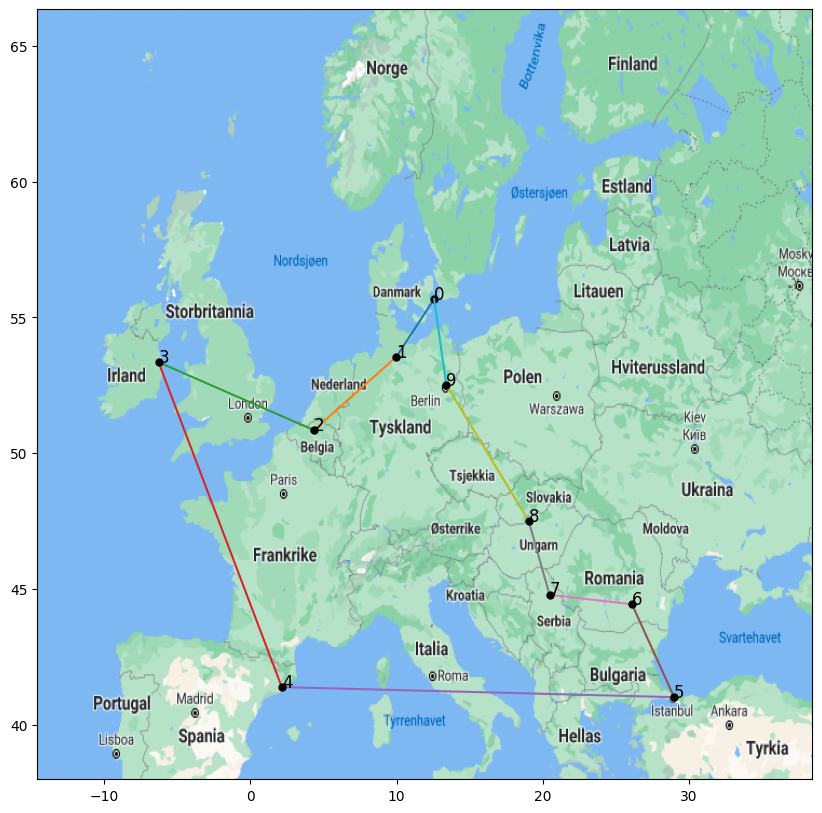

Best Route: ['London', 'Paris', 'Brussels', 'Berlin', 'Prague', 'Budapest', 'Vienna', 'Munich', 'Milan', 'Madrid', 'Barcelona', 'Rome', 'Belgrade', 'Kyiv', 'Saint Petersburg', 'Moscow', 'Istanbul', 'Sofia', 'Bucharest', 'Warsaw', 'Stockholm', 'Copenhagen', 'Hamburg', 'Dublin']
24 Cities - Best: 12287.07, Worst: 16700.159999999996, Mean: 14628.31, Std: 1139.67, Time: 10.17


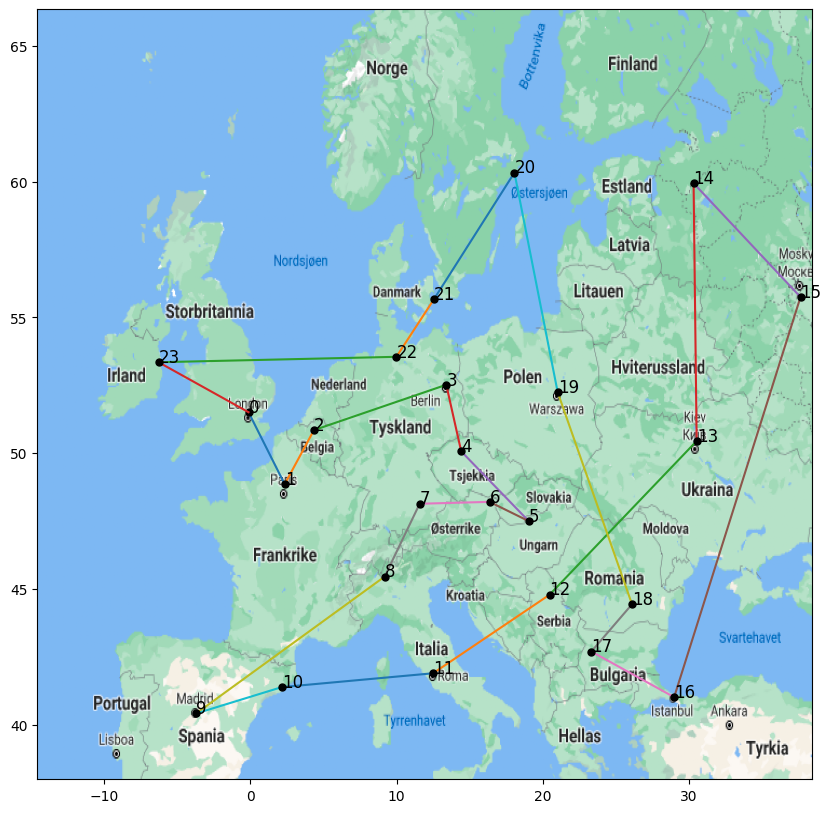

In [21]:
# Implement the algorithm here
import random


cities10 = city_list[:10]
cities24 = city_list[:24]

# Hill Climbing most usefull iterations are 10.000, bigger iterations will take a long time to run, smaler iterations is 2000km worse in average.
def hill_climbing(starting_route, starting_distance, iterations):
    best_route, best_distance = starting_route, starting_distance
    
    for _ in range(iterations):
        new_route = list(best_route)
        
        # Swap two random cities
        i, j = random.sample(range(len(new_route)), 2)
        new_route[i], new_route[j] = new_route[j], new_route[i]

        new_distance = total_distance(tuple(new_route))
        
        # Accept new route if it's better
        if new_distance < best_distance:
            best_route, best_distance = new_route, new_distance
    
    return best_route, best_distance

def run_experiment(cities, iterations, runs):
    results = []
    cities = list(cities)
    time_start = time.time()
    
    for _ in range(runs):
        cities = random.sample(cities, len(cities))
        distanse = total_distance(tuple(cities))
        best_route, best_distance = hill_climbing(cities, distanse, iterations)
        results.append(best_distance)
    
    time_end = time.time()
    print("Best Route:", best_route)
    print(f"{len(cities)} Cities - Best: {min(results)}, Worst: {max(results)}, Mean: {np.mean(results):.2f}, Std: {np.std(results):.2f}, Time: {time_end - time_start:.2f}")
    plot_plan(best_route)
    

run_experiment(cities10, iterations=1000, runs=20)
run_experiment(cities24, iterations=30000, runs=20)


## Genetic Algorithm
Next, write a genetic algorithm (GA) to solve the problem. Choose mutation and crossover operators that are appropriate for the problem (see chapter 4.5 of the Eiben and Smith textbook). Choose three different values for the population size. Define and tune other parameters yourself and make assumptions as necessary (and report them, of course).

For all three variants: As with the hill climber, report best, worst, mean and standard deviation of tour length out of 20 runs of the algorithm (of the best individual of last generation). Also, find and plot the average fitness of the best fit individual in each generation (average across runs), and include a figure with all three curves in the same plot in the report. This means that the x-axis should be the generations over time and the y-axis should be the average (over the 20-runs) fitness of the best gene in that generation. Conclude which is best in terms of tour length and number of generations of evolution time.

Finally, plot an example optimized tour (the best of the final generation) for the three different population sizes, using the plot_plan method.

Best Route: ['Vienna', 'Prague', 'Munich', 'Milan', 'Rome', 'Barcelona', 'Madrid', 'Paris', 'London', 'Dublin', 'Brussels', 'Hamburg', 'Copenhagen', 'Berlin', 'Warsaw', 'Stockholm', 'Saint Petersburg', 'Moscow', 'Kyiv', 'Bucharest', 'Istanbul', 'Sofia', 'Belgrade', 'Budapest']
Population 100 - Best: 12455.850000000002, Worst: 13344.33, Mean: 12885.43, Std: 263.55, Time: 9.11


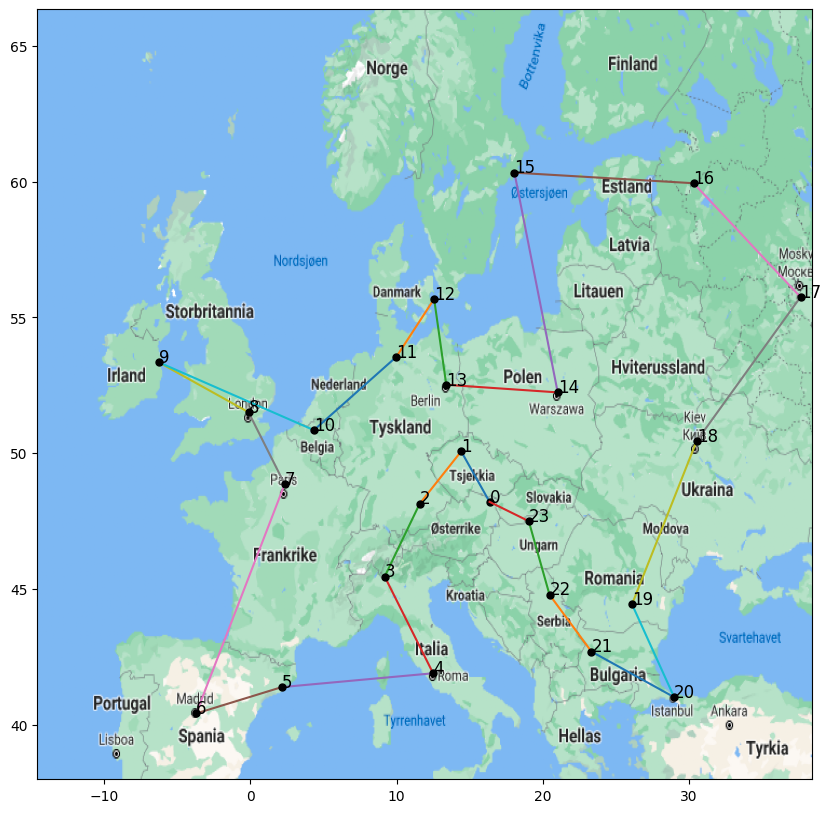

Best Route: ['Barcelona', 'Rome', 'Milan', 'Munich', 'Prague', 'Berlin', 'Warsaw', 'Vienna', 'Budapest', 'Belgrade', 'Sofia', 'Istanbul', 'Bucharest', 'Kyiv', 'Moscow', 'Saint Petersburg', 'Stockholm', 'Copenhagen', 'Hamburg', 'Brussels', 'Paris', 'London', 'Dublin', 'Madrid']
Population 200 - Best: 12287.069999999996, Worst: 13338.07, Mean: 12656.42, Std: 266.78, Time: 14.26


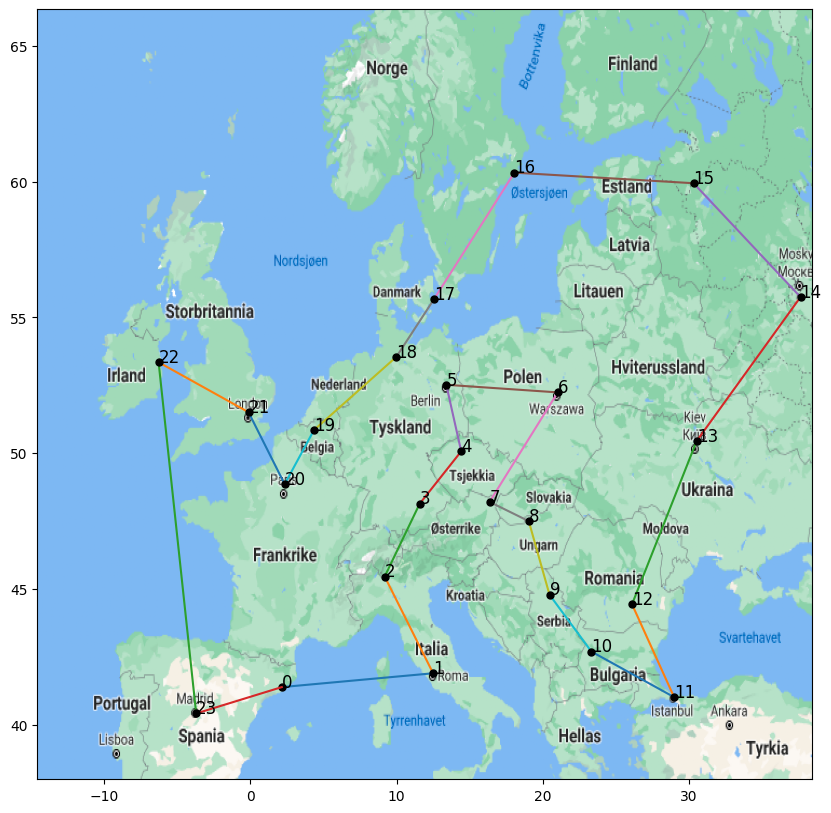

Best Route: ['Barcelona', 'Rome', 'Milan', 'Munich', 'Prague', 'Berlin', 'Warsaw', 'Vienna', 'Budapest', 'Belgrade', 'Sofia', 'Istanbul', 'Bucharest', 'Kyiv', 'Moscow', 'Saint Petersburg', 'Stockholm', 'Copenhagen', 'Hamburg', 'Brussels', 'Paris', 'London', 'Dublin', 'Madrid']
Population 400 - Best: 12287.069999999996, Worst: 12643.55, Mean: 12433.14, Std: 115.77, Time: 29.33


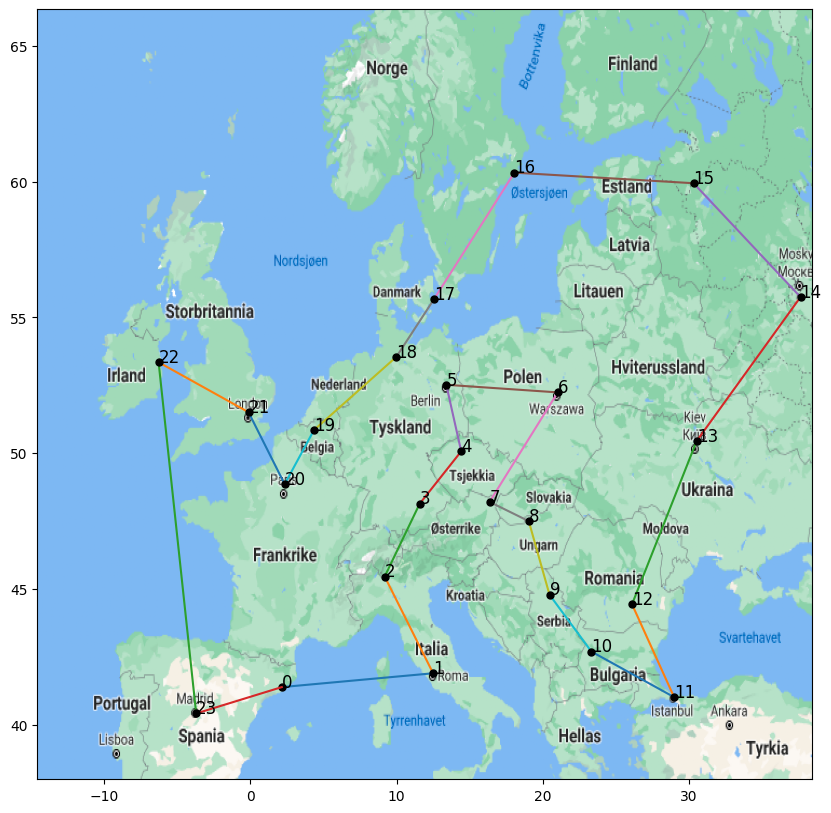

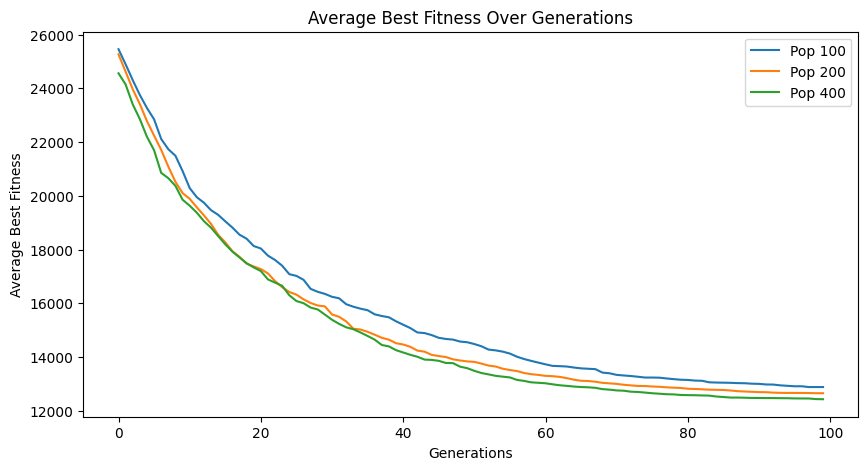

In [22]:
# Implement the algorithm here

# Partially Mapped Crossover (PMX) for two parents.
# too many permutations and good crossovers are not guaranteed.
def pmx(parent1, parent2):
    
    size = len(parent1)
    cxpoint1, cxpoint2 = sorted(random.sample(range(size), 2))
    
    child1, child2 = parent1[:], parent2[:]
    mapping1, mapping2 = {}, {}
    
    for i in range(cxpoint1, cxpoint2 + 1):
        mapping1[parent2[i]] = parent1[i]
        mapping2[parent1[i]] = parent2[i]
        child1[i], child2[i] = parent2[i], parent1[i]
    
    def apply_mapping(child, mapping):
        for i in range(size):
            if i < cxpoint1 or i > cxpoint2:
                while child[i] in mapping:
                    child[i] = mapping[child[i]]
        return child
    
    return apply_mapping(child1, mapping1), apply_mapping(child2, mapping2)

# Ordered Crossover (OX) for two parents.
# better than PMX, but I don't think it is the best solution.
def ox(parent1, parent2):
  
    size = len(parent1)
    cxpoint1, cxpoint2 = sorted(random.sample(range(size), 2))
    child1, child2 = [-1] * size, [-1] * size
    
    child1[cxpoint1:cxpoint2] = parent1[cxpoint1:cxpoint2]
    child2[cxpoint1:cxpoint2] = parent2[cxpoint1:cxpoint2]
    
    def fill_child(child, parent):
        idx = cxpoint2
        for gene in parent:
            if gene not in child:
                if idx >= size:
                    idx = 0
                child[idx] = gene
                idx += 1
        return child
    
    return fill_child(child1, parent2), fill_child(child2, parent1)

def elitist_selection(initial_population, population_size, generations, crossover_method):
    fitness_history = []
    for _ in range(generations):
        initial_population = sorted(initial_population, key=lambda x: total_distance(tuple(x)))
        fitness_history.append(total_distance(tuple(initial_population[0])))
        initial_population = initial_population[:population_size]
        
        children = []
        for _ in range(population_size // 2):
            parent1, parent2 = random.sample(initial_population, 2)
            child1, child2 = crossover_method(parent1, parent2)
            children.extend([child1, child2])
        
        initial_population += children
    return initial_population, fitness_history

def run_experiment(cities, population_size, generations, runs, crossover_method):
    results = []
    fitness_over_time = []
    best_routes = []  # Store best routes

    for _ in range(runs):
        population = [random.sample(cities, len(cities)) for _ in range(population_size)]
        final_population, fitness_history = elitist_selection(population, population_size, generations, crossover_method)
        
        best_route = final_population[0]  # Ensure first is the best
        best_distance = total_distance(tuple(best_route))
        
        results.append(best_distance)
        best_routes.append(best_route)
        fitness_over_time.append(fitness_history)

    best_index = np.argmin(results)
    best_route = best_routes[best_index]  # Get the best corresponding route

    avg_fitness = np.mean(fitness_over_time, axis=0)
    return results, avg_fitness, best_route


def compare_population_sizes(cities, generations, runs, crossover_method):
    population_sizes = [100, 200, 400]
    fitness_curves = {}
    for pop_size in population_sizes:
        time_start = time.time()
        results, avg_fitness, best_route = run_experiment(cities, pop_size, generations, runs, crossover_method)
        fitness_curves[pop_size] = avg_fitness
        time_end = time.time()
        print("Best Route:", best_route)
        print(f"Population {pop_size} - Best: {min(results)}, Worst: {max(results)}, Mean: {np.mean(results):.2f}, Std: {np.std(results):.2f}, Time: {time_end - time_start:.2f}")
        plot_plan(best_route)
    
    plt.figure(figsize=(10, 5))
    for pop_size, avg_fitness in fitness_curves.items():
        plt.plot(range(generations), avg_fitness, label=f"Pop {pop_size}")
    
    plt.xlabel("Generations")
    plt.ylabel("Average Best Fitness")
    plt.title("Average Best Fitness Over Generations")
    plt.legend()
    plt.show()

compare_population_sizes(cities24, generations=100, runs=20, crossover_method=ox)


Among the first 10 cities, did your GA find the shortest tour (as found by the exhaustive search)? Did it come close? 

For both 10 and 24 cities: How did the running time of your GA compare to that of the exhaustive search? 

How many tours were inspected by your GA as compared to by the exhaustive search?

Best Route: ['Copenhagen', 'Hamburg', 'Brussels', 'Dublin', 'Barcelona', 'Belgrade', 'Istanbul', 'Bucharest', 'Budapest', 'Berlin']
Population 100 - Best: 7486.309999999999, Worst: 7726.36, Mean: 7517.85, Std: 66.10, Time: 0.53


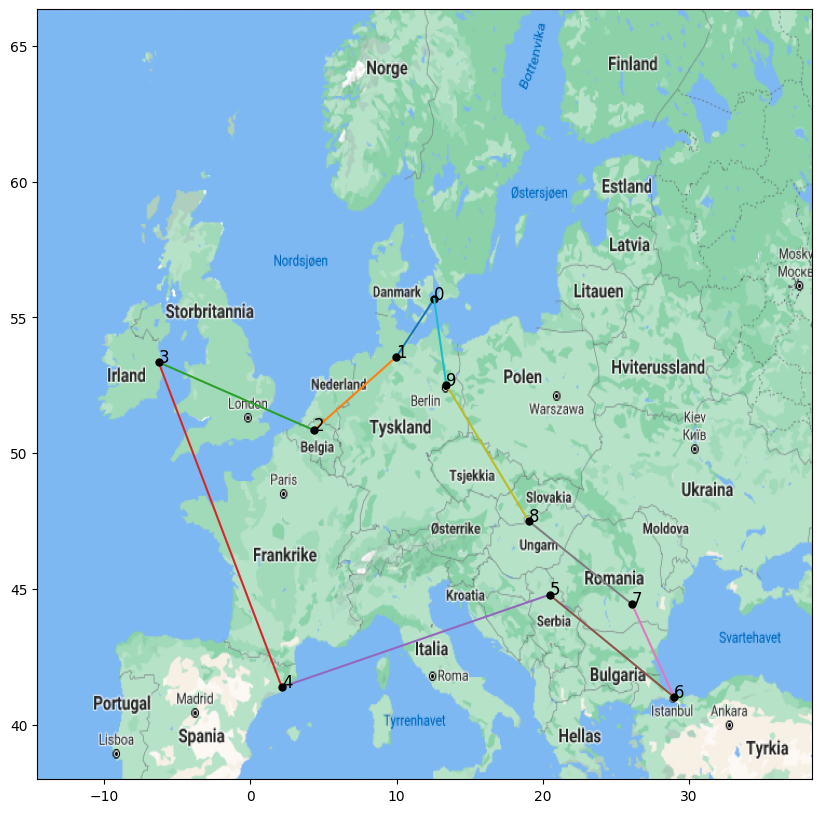

Best Route: ['Copenhagen', 'Hamburg', 'Brussels', 'Dublin', 'Barcelona', 'Belgrade', 'Istanbul', 'Bucharest', 'Budapest', 'Berlin']
Population 200 - Best: 7486.309999999999, Worst: 7503.099999999999, Mean: 7487.15, Std: 3.66, Time: 1.17


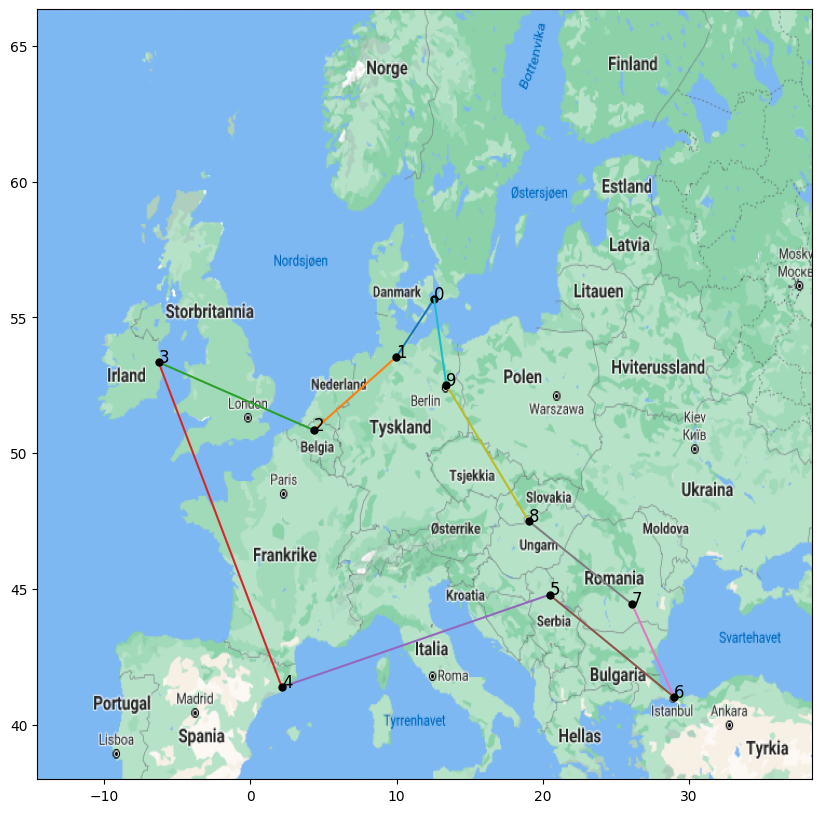

Best Route: ['Copenhagen', 'Hamburg', 'Brussels', 'Dublin', 'Barcelona', 'Belgrade', 'Istanbul', 'Bucharest', 'Budapest', 'Berlin']
Population 400 - Best: 7486.309999999999, Worst: 7486.3099999999995, Mean: 7486.31, Std: 0.00, Time: 2.15


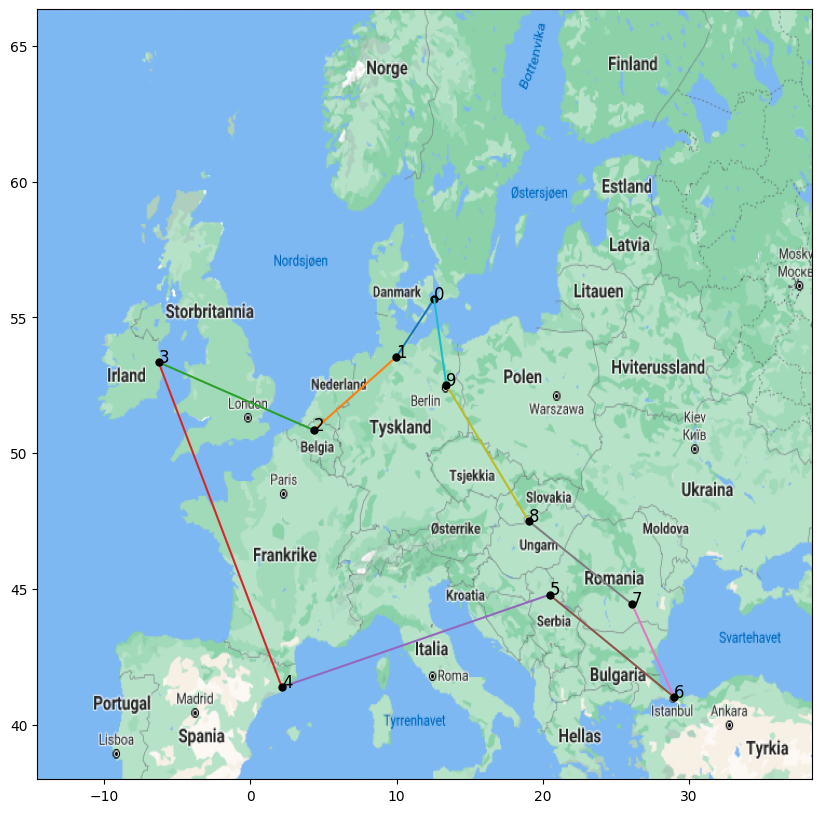

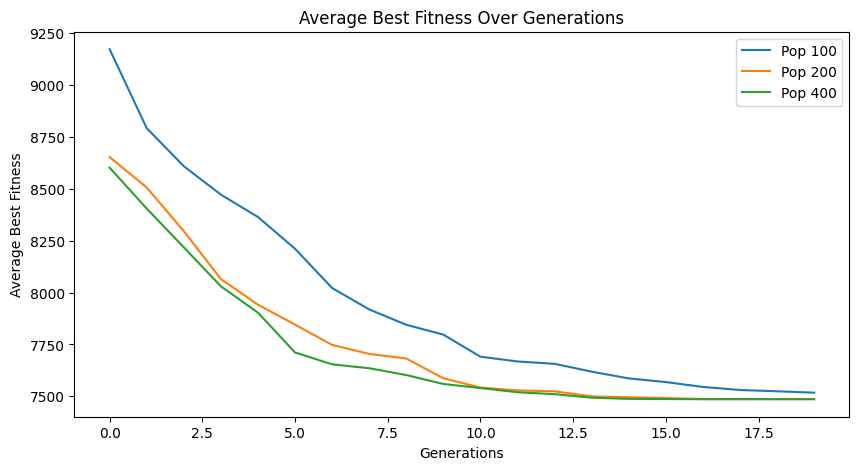

In [23]:
# Answer
compare_population_sizes(cities10, generations=20, runs=20, crossover_method=ox)

# Yes, the algorithm have found the optimal route for the 10 cities. 
# It was enoiugh with 20 runs, 20 generations and population of 100 to find the best solution.

# GA algorithm:
# Running time for 10 cities is 0.8 seconds, with 20 generations and population of 100 routes, 
# Running time for 24 cities is 13.6 seconds, with 100 generations and population of 200 routes, 

# Exhaustive search algorithm:
# Running time for 10 cities is 21 seconds,
# Running time for 24 cities is many years (9^18 years).

# GA algorithm
# Inspected 20000 tours for 10 cities (20 runs, 20 generations and population of 100/2=50 routes),
# Inspected 200000 tours for 24 cities (20 runs, 100 generations and population of 200/2=100 routes).

# Exhaustive search algorithm
# Inspected 3628800 tours for 10 cities,
# Inspected 620448401733239439360000 tours for 24 cities.

## Hybrid Algorithm (IN4050 only)
### Lamarckian
Lamarck, 1809: Traits acquired in parents’ lifetimes can be inherited by offspring. In general the algorithms are referred to as Lamarckian if the result of the local search stage replaces the individual in the population.
### Baldwinian
Baldwin effect suggests a mechanism whereby evolutionary progress can be guided towards favourable adaptation without the changes in individual's fitness arising from learning or development being reflected in changed genetic characteristics. In general the algorithms are referred to as Baldwinian if the original member is kept, but has as its fitness the value belonging to the outcome of the local search process.


(See chapter 10 and 10.2.1 from Eiben and Smith textbook for more details. It will also be lectured in Lecure 3)

### Task
Implement a hybrid algorithm to solve the TSP: Couple your GA and hill climber by running the hill climber a number of iterations on each individual in the population as part of the evaluation. Test both Lamarckian and Baldwinian learning models and report the results of both variants in the same way as with the pure GA (min,
max, mean and standard deviation of the end result and an averaged generational plot). How do the results compare to that of the pure GA, considering the number of evaluations done?

Mode: Pure GA
Best Route: ['Barcelona', 'Rome', 'Milan', 'Munich', 'Prague', 'Berlin', 'Warsaw', 'Vienna', 'Budapest', 'Belgrade', 'Sofia', 'Bucharest', 'Istanbul', 'Kyiv', 'Moscow', 'Saint Petersburg', 'Stockholm', 'Copenhagen', 'Hamburg', 'Brussels', 'Paris', 'London', 'Dublin', 'Madrid']
Population 50 - Best: 12389.649999999998, Worst: 15136.48, Mean: 13392.84, Std: 703.38, Time: 5.71


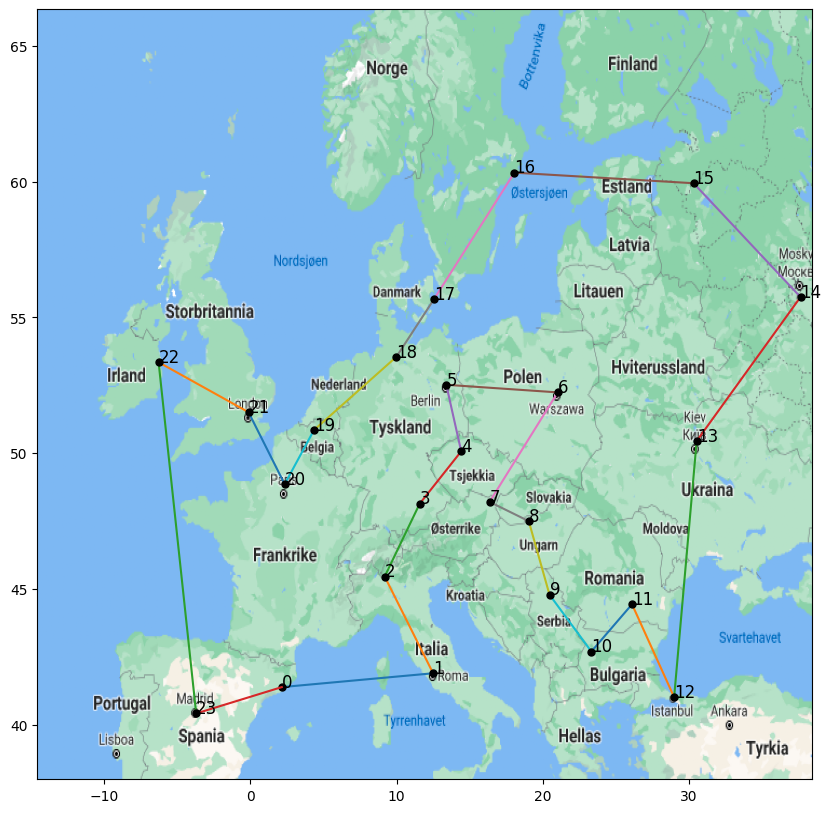

Mode: lamarckian
Best Route: ['London', 'Paris', 'Brussels', 'Hamburg', 'Berlin', 'Copenhagen', 'Stockholm', 'Saint Petersburg', 'Moscow', 'Kyiv', 'Bucharest', 'Istanbul', 'Sofia', 'Belgrade', 'Budapest', 'Vienna', 'Warsaw', 'Prague', 'Munich', 'Milan', 'Rome', 'Barcelona', 'Madrid', 'Dublin']
Population 50 - Best: 12325.929999999998, Worst: 13493.48, Mean: 12642.30, Std: 380.92, Time: 14.91


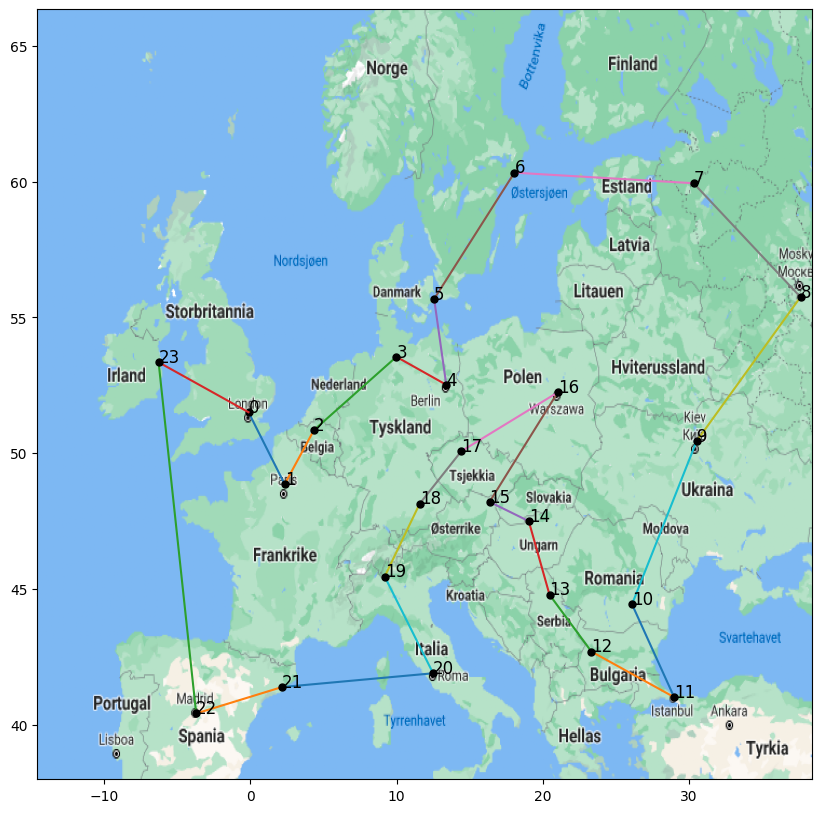

Mode: baldwinian
Best Route: ['Brussels', 'Munich', 'Prague', 'Warsaw', 'Berlin', 'Hamburg', 'Copenhagen', 'Stockholm', 'Saint Petersburg', 'Moscow', 'Kyiv', 'Bucharest', 'Istanbul', 'Sofia', 'Belgrade', 'Budapest', 'Vienna', 'Rome', 'Milan', 'Barcelona', 'Madrid', 'Dublin', 'London', 'Paris']
Population 50 - Best: 12613.409999999998, Worst: 14139.360000000002, Mean: 13425.59, Std: 393.24, Time: 13.24


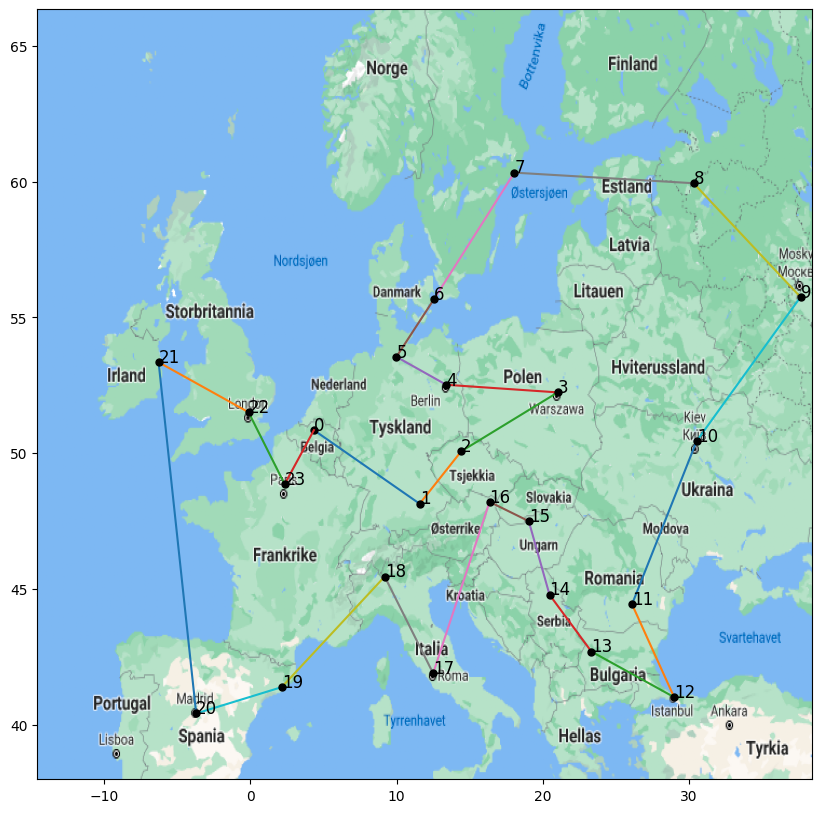

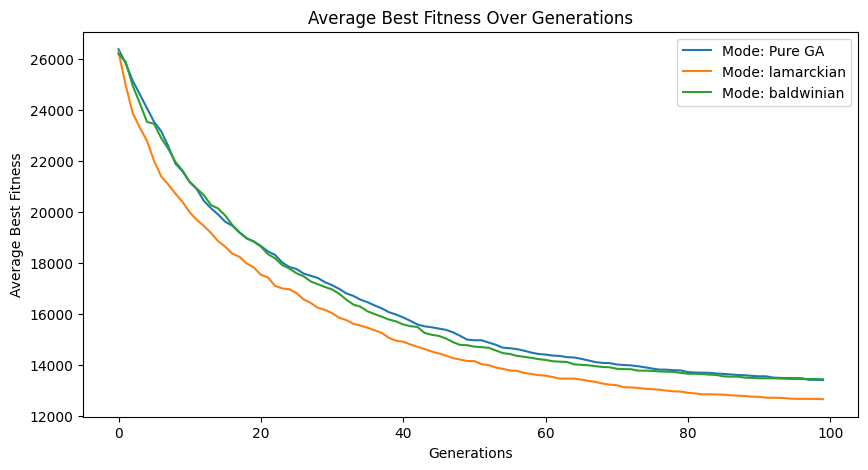

In [39]:
# Implement algorithm here

# Lamarckian evolution performed better than Baldwinian and pure GA in my hybrid GA for TSP. 
# This is because Lamarckian directly modifies the individual's genes using hill climbing, 
# meaning that improved solutions are passed on to the next generation, leading to faster convergence. 
# On the other hand, Baldwinian evolution improves the fitness of an individual during evaluation but does not modify its genetic structure, 
# meaning that beneficial traits are not inherited. 
# While pure GA does not perform any local search for finding better solutions and relies on crossover and mutation operators only.
# 
# However, Lamarckian and Baldwinian evolution takes longer time to execute in my implementation which is due to hill_climbing inneficenc.
# So my personal favorite is pure GA with OX crossover method, as it is faster and still finds good solutions, but it needs bigger population to pick parents from.

def hybrid_selection(initial_population, population_size, generations, crossover_method, iterations, mode):
    fitness_history = []
    
    for _ in range(generations):
        # Evaluate population fitness
        population_with_fitness = [(ind, total_distance(tuple(ind))) for ind in initial_population]
        
        # Sort based on fitness (lower distance is better)
        population_with_fitness.sort(key=lambda x: x[1])  
        
        # Store best solution fitness
        fitness_history.append(population_with_fitness[0][1])
        
        # Select the best individuals to form the next generation
        population_with_fitness = population_with_fitness[:population_size]

        # Extract only individuals from sorted tuples
        initial_population = [ind for ind, _ in population_with_fitness]

        children = []
        for _ in range(population_size // 2):
            parent1, parent2 = random.sample(initial_population, 2)
            child1, child2 = crossover_method(parent1, parent2)

            if mode == "lamarckian":
                # Apply hill climbing and replace individuals directly
                child1, _ = hill_climbing(child1, total_distance(tuple(child1)), iterations)
                child2, _ = hill_climbing(child2, total_distance(tuple(child2)), iterations)
            
            elif mode == "baldwinian":
                # Apply hill climbing but do NOT modify the individuals
                improved1, fitness1 = hill_climbing(child1, total_distance(tuple(child1)), iterations)
                improved2, fitness2 = hill_climbing(child2, total_distance(tuple(child2)), iterations)

                # Store original individuals but keep the improved fitness
                children.append((child1, fitness1))
                children.append((child2, fitness2))
                continue  # Prevents appending unprocessed children later

            # Append modified children for Lamarckian
            children.append((child1, total_distance(tuple(child1))))
            children.append((child2, total_distance(tuple(child2))))

        # Merge with previous population
        initial_population = [ind for ind, _ in population_with_fitness] + [ind for ind, _ in children]

    return initial_population, fitness_history


def run_experiment(cities, population_size, generations, runs, crossover_method, iterations, mode):
    results = []
    fitness_over_time = []
    best_routes = []  # Store best routes

    for _ in range(runs):
        population = [random.sample(cities, len(cities)) for _ in range(population_size)]
        if mode == "lamarckian":
            final_population, fitness_history = hybrid_selection(population, population_size, generations, crossover_method, iterations, mode="lamarckian")
        elif mode == "baldwinian":
            final_population, fitness_history = hybrid_selection(population, population_size, generations, crossover_method, iterations, mode="baldwinian")
        else:
            final_population, fitness_history = elitist_selection(population, population_size, generations, crossover_method)
        
        best_route = final_population[0]  # Ensure first is the best
        best_distance = total_distance(tuple(best_route))
        
        results.append(best_distance)
        best_routes.append(best_route)
        fitness_over_time.append(fitness_history)

    best_index = np.argmin(results)
    best_route = best_routes[best_index]  # Get the best correspoqnding route

    avg_fitness = np.mean(fitness_over_time, axis=0)
    return results, avg_fitness, best_route

def compare_hybrid_algorithms(cities, population_size, generations, runs, crossover_method, iterations):
    fitness_curves = {}
    modes = ["Pure GA", "lamarckian", "baldwinian"]
    for mode in modes:
        time_start = time.time()
        results, avg_fitness, best_route = run_experiment(cities, population_size, generations, runs, crossover_method, iterations, mode)
        fitness_curves[mode] = avg_fitness
        time_end = time.time()
        print("Mode:", mode)
        print("Best Route:", best_route)
        print(f"Population {population_size} - Best: {min(results)}, Worst: {max(results)}, Mean: {np.mean(results):.2f}, Std: {np.std(results):.2f}, Time: {time_end - time_start:.2f}")
        plot_plan(best_route)
    
    plt.figure(figsize=(10, 5))
    for mode, avg_fitness in fitness_curves.items():
        plt.plot(range(generations), avg_fitness, label=f"Mode: {mode}")
    
    plt.xlabel("Generations")
    plt.ylabel("Average Best Fitness")
    plt.title("Average Best Fitness Over Generations")
    plt.legend()
    plt.show()

compare_hybrid_algorithms(cities=cities24, population_size=50, generations=100, runs=20, crossover_method=ox, iterations=2)